# CLASSIC CYCLIC VOLTAMMETRY (CV)

This model (Python 3.7) assumes equilbrium(infinite kinetics at the electrode
A one electron transfer and that diffusion coefficients are equal.  Best
suited to exploring the effect of scan rate and diffusivity have on CV.
The model also includes double layer charging. January 2, 2019
The three parameters you may want to change are sr, the scan rate, C the
capacitance, and D, the diffusion coefficient

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
# import os, sys
# import matplotlib

%matplotlib inline

In [2]:
#TEMPERATURE AND CONSTANTS
T_ex = 298.15   #Temperature, K
F = 96485.0     #Faraday's constant
R = 8.414       #Universal gas constant
frt = F/R/T_ex

#VOLTAMMETRY PARAMETERS
sr = 0.007      #scan rate [V/s]
upl = 0.300     #upper potential limit [V]
sp = 0.0        #starting potential [V]

#ELECTRODE KINETIC PARAMETERS AND DIFFISION COEFFICIENT
C = 20          #double layer capacitance [F/m^2]
D = 4.0e-9      #Diffusion coefficient, m2/s

#TIME INTEGRATION PARAMETERS
t_start = 0                 #always start at time zero
t_final = 4*(upl-sp)/sr     #completes just one cycle
t_peak  = (upl-sp)/sr       #time to reach peak potential
t_min   = 3*(upl-sp)/sr     #time to reach minimum potential
dt = t_final/500.0          #step size for time
t = np.linspace(t_start, t_final, num=500)

In [3]:
#ESTABLISH POTENTIAL PROFILE FOR SINGLE CV+ final anodic sweep
V = np.ones(len(t))
cd = np.zeros(len(t)) #set up array to record i(t), current density
s1 = int((len(t))/4)
s2 = int((3*len(t))/4)
for i in range (0, s1):
    V[i] = sp+sr*t[i]
for j in range(s1, s2):
    V[j] = upl-(t[j]-t_peak)*sr
for k in range(s2, len(t)):
    V[k] = -upl+(t[k]-t_min)*sr

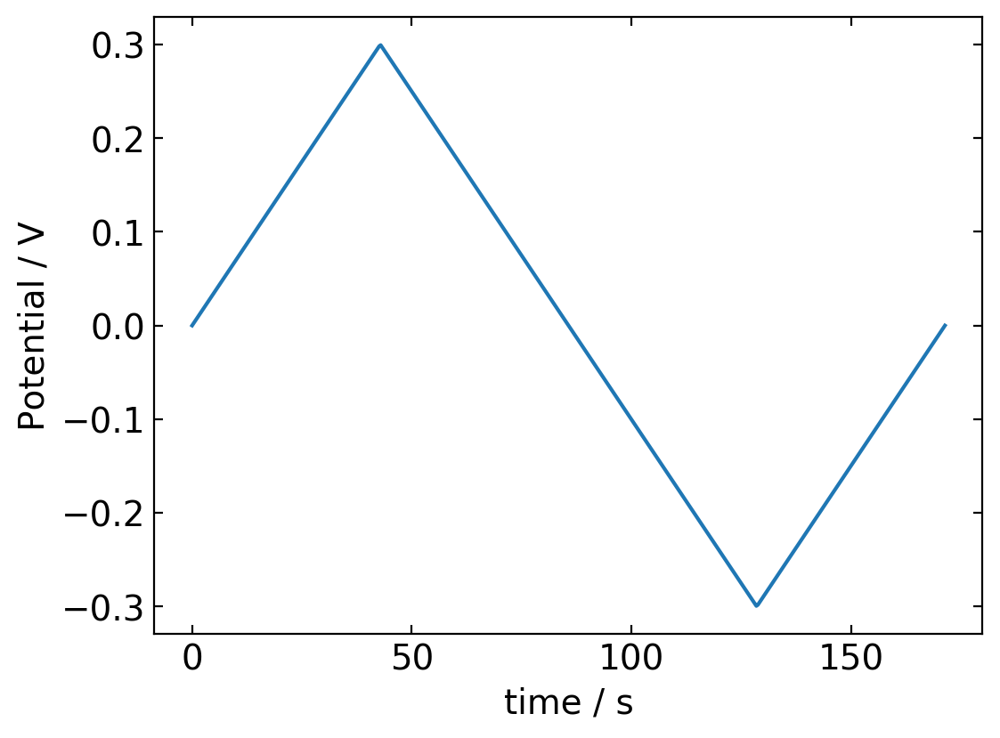

In [4]:
plot(t,V)
xlabel('time / s')
ylabel('Potential / V')
show()

## Function to create charging current

In [5]:
idl = np.zeros(len(t))
for i in range (0, s1):
    idl[i] = sr*C
for j in range(s1, s2):
    idl[j] = -sr*C
for k in range(s2, len(t)):
    idl[k] = sr*C
    

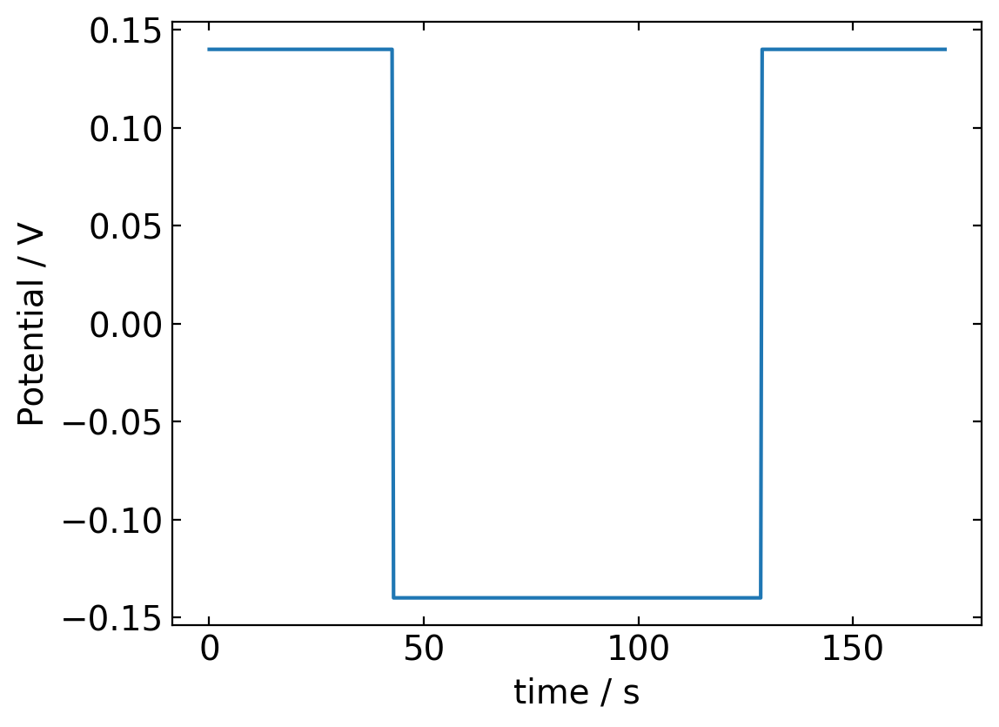

In [6]:
plot(t,idl)
xlabel('time / s')
ylabel('Potential / V')
show()

In [7]:
#NUMERICAL PARAMETERS
N = 41          #number of grid points
Lc = 3*np.sqrt(2*D*t_final) #characteristic length, penetration depth for diffusion
nsteps = 499    #number of time steps
dx = Lc/(N-1)   #grid spacing
r = D*dt/dx**2

#INITIALIZE MATRICES A, B and b
A = np.zeros((N-2,N-2)) #python starts at zero, so we only go to N-2
B = np.zeros((N-2,N-2))
b = np.zeros((N-2))
#define matrices A, B and b array
for i in range(N-2):
    if i==0:
        A[i,:] = [2+2*r if j==0 else (-r) if j==1 else 0 for j in range(N-2)]
        B[i,:] = [2-2*r if j==0 else r if j==1 else 0 for j in range(N-2)]
        b[i] = 2*r*V[0] #boundary condition at i=1
    elif i==N-2:
        A[i,:] = [-r if j==N-4 else 2*2*r if j==N-3 else 0 for j in range(N-2)]
        B[i,:] = [r if j==N-4 else 2-2*r if j==N-3 else 0 for j in range(N-2)]
        b[i] = 0.0 #boundary condition at i=N
    else:
        A[i,:] = [-r if j==i-1 or j==i+1 else 2+2*r if j==i else 0 for j in range(N-2)]
        B[i,:] = [r if j==i-1 or j==i+1 else 2-2*r if j==i else 0 for j in range(N-2)]
#initialize grid
x = np.linspace(0,1,N)
#intial conditions
u = np.asarray([0.0 for xx in x])
w = np.asarray([0.0 for xx in x])
#u =  np.asarray([1.0 if xx<=0.5 else 2*(1-xx) for xx in x])

#evaluate right hand side at t=0
bb = B.dot(u[1:-1])+ b #calculate right hand side based on initial conditions
#syntax is start with 2nd element in matrix and stop at the next to the last one, the idea
#is that the first and last are determined by boundary conditions

# matplotlib.rc('font', size=18)
# matplotlib.rc('font', family='Arial')

In [8]:
#TIME MARCHING IMPLICIT SOLUTION
c = 0  #counter to keep track of step number
for j in range(nsteps): #j=0 corresponds to the first time step
#   print(j)
#find solution inside domain
    u[1:-1] = np.linalg.solve(A,bb)
    u[0] =(1000.0 + 1000.0)*np.exp(frt*V[j])/(1.0 + np.exp(frt*V[j]))-1000.0
    for kk in range (N-1):
        w[kk]=-u[kk]
    
#update right hand side
    bb = B.dot(u[1:-1]) + b
    ca = (1000.0 + 1000.0)*np.exp(frt*V[j+1])/(1.0 + np.exp(frt*V[j+1]))-1000.0
    b[0] = 2*r*ca #boundary condition at i=1
#use fwd difference to calculate the current density at surface
    cd[j+1] = -F*D*(-u[2]+4*u[1]-3*u[0])/dx/2 + idl[j+1]
c +=1

#SIMPLY REPEATING THE INTEGRATION FOR SECOND CYCLE
c = 0  #counter to keep track of step number
for j in range(nsteps): #j=0 corresponds to the first time step
#   print(j)
#find solution inside domain
    u[1:-1] = np.linalg.solve(A,bb)
    u[0] =(1000.0 + 1000.0)*np.exp(frt*V[j])/(1.0 + np.exp(frt*V[j]))-1000.0
    for kk in range (N-1):
        w[kk]=-u[kk]
    
#update right hand side
    bb = B.dot(u[1:-1]) + b
    ca = (1000.0 + 1000.0)*np.exp(frt*V[j+1])/(1.0 + np.exp(frt*V[j+1]))-1000.0
    b[0] = 2*r*ca #boundary condition at i=1
#use fwd difference to calculate the current density at surface
    cd[j+1] = -F*D*(-u[2]+4*u[1]-3*u[0])/dx/2 + idl[j+1]

c +=1

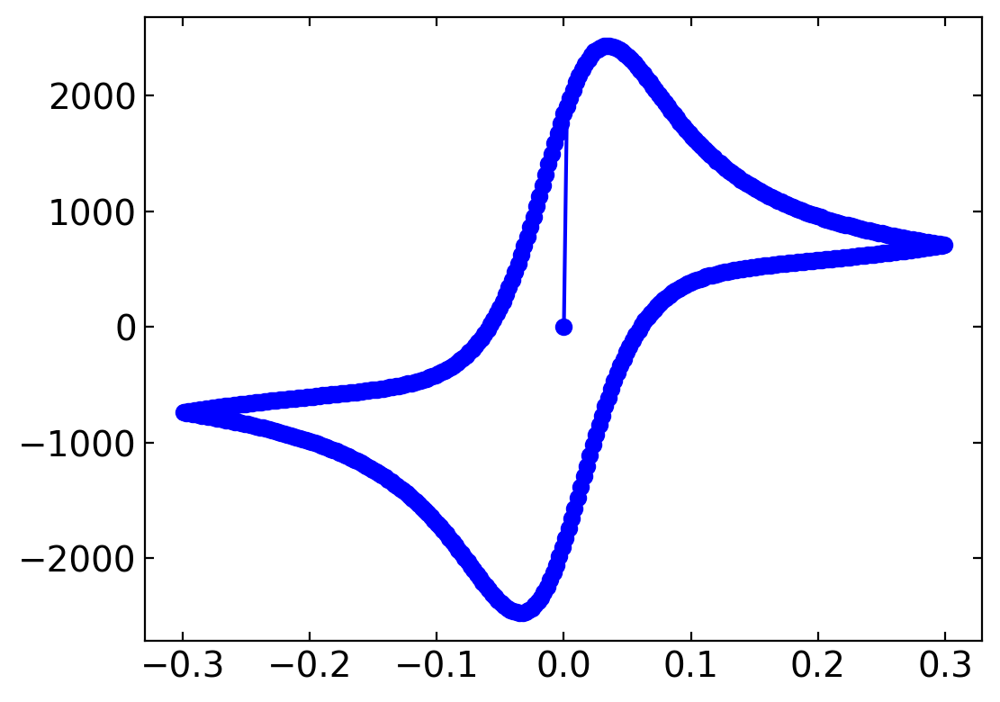

In [9]:
#######################   ANIMATION
fig2, ax = plt.subplots()
x = V
y = cd
line, = ax.plot(x, y, 'b-o')

## Animation

In [10]:
def animate(i):
    line.set_ydata(cd[1:i])
    line.set_xdata(V[1:i]) # update the data.
#     if i > 499:
#         import sys
#         sys.exit()
    return line,


ani = animation.FuncAnimation(fig2, animate, frames=len(V), interval=20)
ani

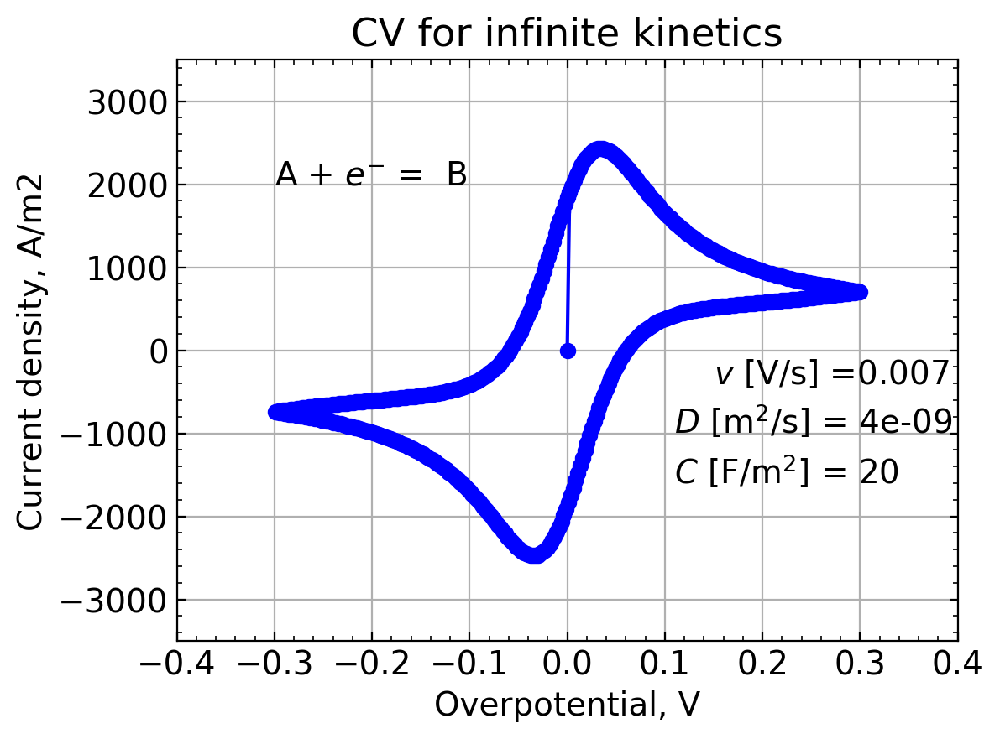

In [11]:
plt.plot(x, y, 'b-o')
plt.xlabel('Overpotential, V')
plt.ylabel('Current density, A/m2')
plt.title('CV for infinite kinetics')
plt.text(-0.3, 2000, 'A + ' r'$e^{-}$' ' =  B')
plt.text(0.15, -400, r'$v$ [V/s] ='+str(sr))
# ax.text(0.31, -400, sr)
plt.text(0.11, -1000, r'$D$ [m$^2$/s] = '+str(D))
# ax.text(0.32, -1000, D)
plt.text(0.11, -1600, r'$C$ [F/m$^2$] = '+str(C))
# ax.text(0.32, -1600, C)

plt.xlim([-0.4, 0.4])
plt.ylim([-3500,3500])
plt.grid(True)
plt.minorticks_on()
plt.locator_params(axis='x', nbins=10)
plt.show()
